In [3]:
import matplotlib.pyplot as plt
import numpy

from util.simulation import (
    get_project_root,
    get_netlist,
    run_simulation,
    parse_data,
    light_sea_green,
    bittersweet,
    black,
    taupe_gray,
    electric_blue,
)
from util.dac import (
    calculate_inl,
    calculate_dnl,
    adjust_m2m_ladder_tb_netlist,
    adjust_bias_gen_tb_netlist,
    adjust_mirrored_ladder_tb_netlist
)

# setup paths
project_root = get_project_root()
mp_root = project_root.joinpath("dac")
sim_directory = mp_root.joinpath("build")

import matplotlib.pyplot as plt
import numpy

%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Testing current 0.0
Testing current 1.666e-12
Testing current 3.332e-12
Testing current 4.9979999999999995e-12
Testing current 6.664e-12
Testing current 8.33e-12
Testing current 9.995999999999999e-12
Testing current 1.1662e-11
Testing current 1.3328e-11
Testing current 1.4994e-11
Testing current 1.666e-11


/home/drew/Documents/git/madvlsi/util/dac.py:34: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


Testing current 1.8326e-11
Testing current 1.9991999999999998e-11
Testing current 2.1658e-11
Testing current 2.3324e-11
Testing current 2.499e-11
Testing current 2.6656e-11
Testing current 2.8322e-11
Testing current 2.9988e-11
Testing current 3.1654e-11
Testing current 3.332e-11
Testing current 3.4986e-11
Testing current 3.6652e-11
Testing current 3.8318e-11
Testing current 3.9983999999999996e-11
Testing current 4.165e-11
Testing current 4.3316e-11
Testing current 4.4982e-11
Testing current 4.6648e-11
Testing current 4.8314e-11
Testing current 4.998e-11
Testing current 5.1646e-11
Testing current 5.3312e-11
Testing current 5.4977999999999996e-11
Testing current 5.6644e-11
Testing current 5.831e-11
Testing current 5.9976e-11
Testing current 6.1642e-11
Testing current 6.3308e-11
Testing current 6.4974e-11
Testing current 6.664e-11
Testing current 6.8306e-11
Testing current 6.9972e-11
Testing current 7.163799999999999e-11
Testing current 7.3304e-11
Testing current 7.497e-11
Testing current

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x74db96d02660> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

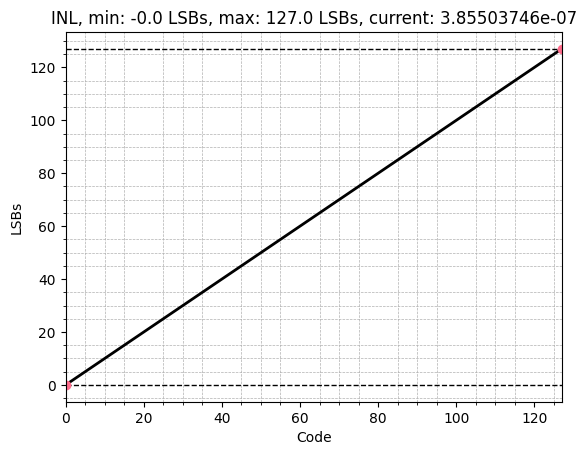

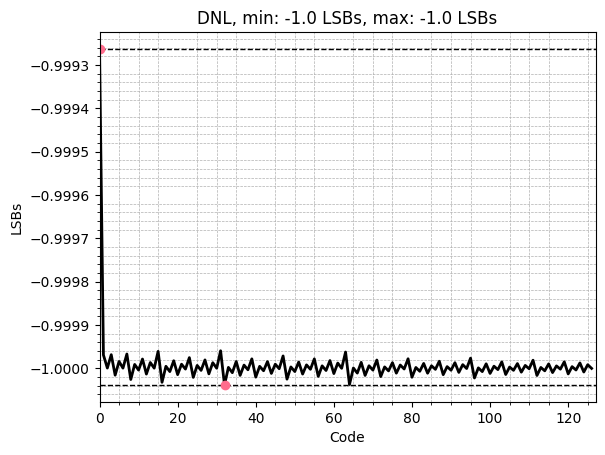

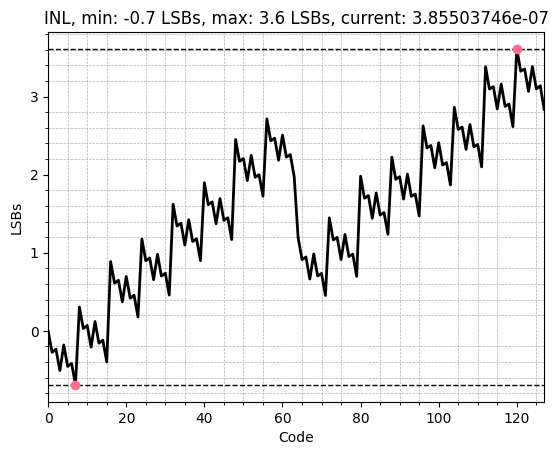

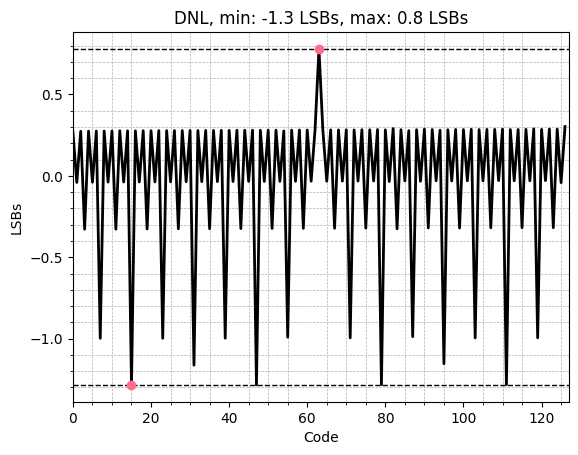

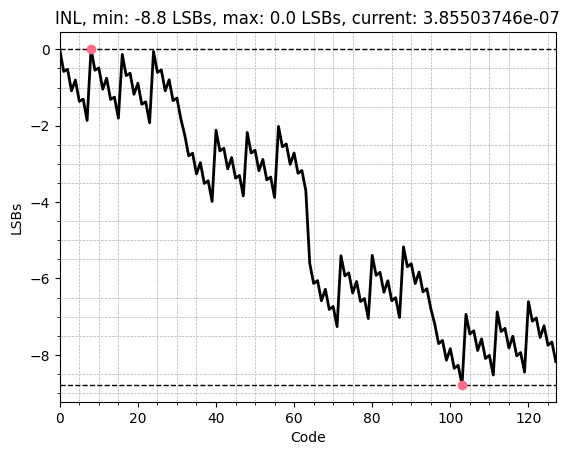

...

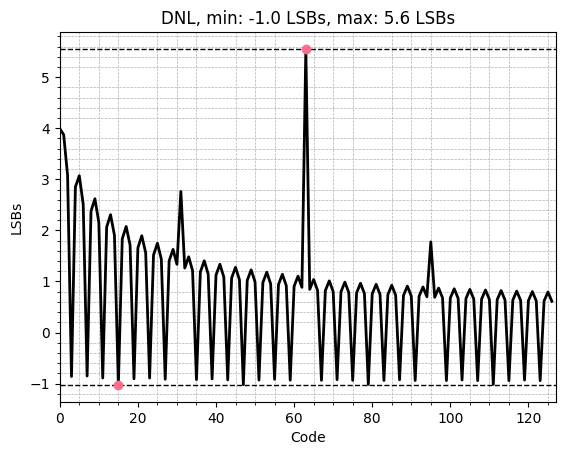

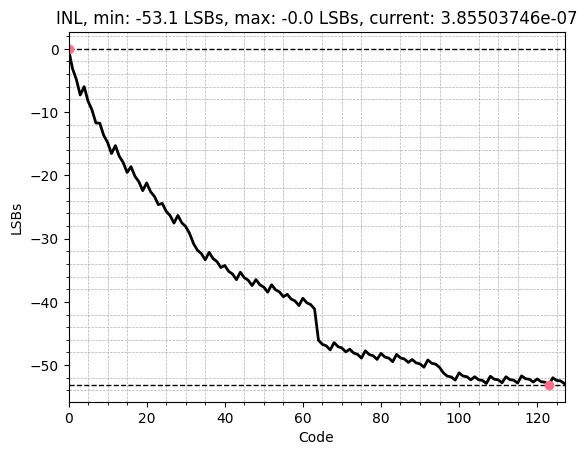

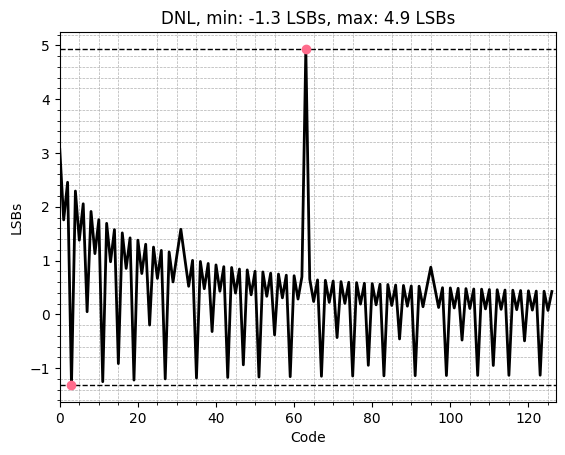

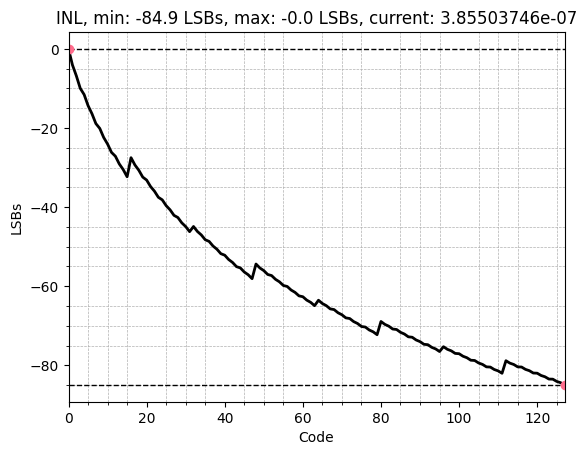

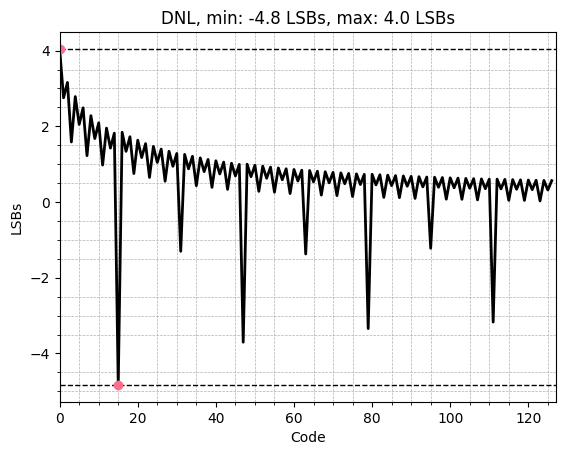

In [5]:
inl_ranges = []
dnl_ranges = []
bias_currents = []

index = 0

bias_currents = [1.666e-12 * index for index in range(0,100)]
input_current = 3.85503746e-07
for bias_current in bias_currents:
  print(f"Testing current {bias_current}")

  m2m_ladder_biased_mirrored_sim_directory = sim_directory.joinpath("m2m_ladder_biased_mirrored")
  m2m_ladder_biased_mirrored_tb_schematic = mp_root.joinpath("schematic/m2m_ladder_biased_mirrored_tb.sch")

  m2m_ladder_biased_mirrored_netlist = get_netlist(
      schematic=m2m_ladder_biased_mirrored_tb_schematic, output=m2m_ladder_biased_mirrored_sim_directory
  )
  
  adjust_mirrored_ladder_tb_netlist(file=m2m_ladder_biased_mirrored_netlist, current=bias_current)

  m2m_ladder_biased_mirrored_data = run_simulation(
      netlist=m2m_ladder_biased_mirrored_netlist, output=m2m_ladder_biased_mirrored_sim_directory
  )

  min_inl, max_inl = calculate_inl(file=m2m_ladder_biased_mirrored_data, input_current=input_current)
  min_dnl, max_dnl = calculate_dnl(file=m2m_ladder_biased_mirrored_data, input_current=input_current)

  inl_ranges.append(max_inl - min_inl)
  dnl_ranges.append(max_dnl - min_dnl)
  bias_currents.append(input_current)
  
  index+=1

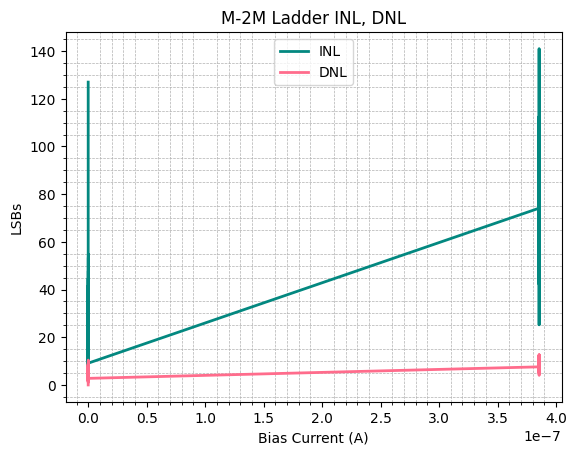

In [ ]:
plt.figure()
plt.title("M-2M Ladder INL, DNL")
plt.xlabel("Bias Current (A)")
plt.ylabel("LSBs")
plt.grid(which="minor", linestyle="--", linewidth=0.5)
plt.minorticks_on()
plt.plot(
    bias_currents[:last_index],
    inl_ranges[:last_index],
    color=light_sea_green,
    linewidth=2,
)
plt.plot(
    bias_currents[:last_index],
    dnl_ranges[:last_index],
    color=bittersweet,
    linewidth=2,
)
plt.legend(["INL", "DNL"])